In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
sns.set_style('dark')
import os
os.chdir('/Users/samuelchazy/ML_files_X/Capstone/Data')
#os.chdir('/Users/samuelchazy/EMA Aesthetics Dropbox/FAB info/ML_files_X/Capstone/Data')
os.getcwd()

'/Users/samuelchazy/ML_files_X/Capstone/Data'

# <span style='color:Magenta'> Transaction Data File  </span>

## <span style='color:Blue'> 36 Rolling Months File</span>
### Numerical file

In [2]:
path_D = 'Transaction_Data_20210128.xlsx'
Transaction_Rolling_Months = pd.read_excel(path_D,skiprows=1,sheet_name='36 Rolling Months')
Transaction_Rolling_Months = Transaction_Rolling_Months.drop('Unnamed: 0',axis=1)
Transaction_Rolling_Months.head().T

,0,1,2,3,4
CONTACT_ID,85102111664960504040,4492101,85102140943881291064,85202121774856516280,0360380
no_of_sales_12M_1,3096,0,0,1,7
no_of_Redemption_12M_1,6592,0,1,0,0
no_of_sales_12M_10K,302,0,0,0,0
no_of_Redemption_12M_10K,157,0,0,0,0
no_of_funds_sold_12M_1,8,0,0,1,1
no_of_funds_redeemed_12M_1,13,0,1,0,0
no_of_fund_sales_12M_10K,7,0,0,0,0
no_of_funds_Redemption_12M_10K,7,0,0,0,0
no_of_assetclass_sold_12M_1,2,0,0,1,1


### Rename the Contact ID and Refresh Date columns

In [3]:
Transaction_Rolling_Months = Transaction_Rolling_Months.rename(columns={'CONTACT_ID':'ID','refresh_date':'date'})


In [4]:
Transaction_Rolling_Months.shape

(360325, 39)

In [5]:
Transaction_Rolling_Months.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360325 entries, 0 to 360324
Data columns (total 39 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   ID                                   360325 non-null  object        
 1   no_of_sales_12M_1                    360325 non-null  int64         
 2   no_of_Redemption_12M_1               360325 non-null  int64         
 3   no_of_sales_12M_10K                  360325 non-null  int64         
 4   no_of_Redemption_12M_10K             360325 non-null  int64         
 5   no_of_funds_sold_12M_1               360325 non-null  int64         
 6   no_of_funds_redeemed_12M_1           360325 non-null  int64         
 7   no_of_fund_sales_12M_10K             360325 non-null  int64         
 8   no_of_funds_Redemption_12M_10K       360325 non-null  int64         
 9   no_of_assetclass_sold_12M_1          360325 non-null  int64         
 

In [6]:
Transaction_Rolling_Months.isna().sum()

ID                                     0
no_of_sales_12M_1                      0
no_of_Redemption_12M_1                 0
no_of_sales_12M_10K                    0
no_of_Redemption_12M_10K               0
no_of_funds_sold_12M_1                 0
no_of_funds_redeemed_12M_1             0
no_of_fund_sales_12M_10K               0
no_of_funds_Redemption_12M_10K         0
no_of_assetclass_sold_12M_1            0
no_of_assetclass_redeemed_12M_1        0
no_of_assetclass_sales_12M_10K         0
no_of_assetclass_Redemption_12M_10K    0
No_of_fund_curr                        0
No_of_asset_curr                       0
AUM                                    0
sales_curr                             0
sales_12M                              0
redemption_curr                        0
redemption_12M                         0
new_Fund_added_12M                     0
redemption_rate                        0
aum_AC_EQUITY                          0
aum_AC_FIXED_INCOME_MUNI               0
aum_AC_FIXED_INC

### Run statistics on each and every numerical column

In [7]:
def run_statistics(df):
    for col in df.columns:
        print('\n'+'='*50)        
        print(col)
        print('='*50)
        print(df[col].describe())
        print('')
        percent = ((df[col] == 0).sum() * 100) / len(df[col])
        print(f'=> => {percent} % of the rows are zeros <= <=')

run_statistics(Transaction_Rolling_Months.select_dtypes(include='number'))



no_of_sales_12M_1
count    360325.000000
mean         18.986512
std          91.471654
min           0.000000
25%           0.000000
50%           0.000000
75%           8.000000
max        6412.000000
Name: no_of_sales_12M_1, dtype: float64

=> => 52.499549018247414 % of the rows are zeros <= <=

no_of_Redemption_12M_1
count    360325.000000
mean         19.173296
std         194.542149
min           0.000000
25%           0.000000
50%           1.000000
75%           7.000000
max       21886.000000
Name: no_of_Redemption_12M_1, dtype: float64

=> => 47.35391660306668 % of the rows are zeros <= <=

no_of_sales_12M_10K
count    360325.000000
mean          2.474727
std          14.492588
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max        1784.000000
Name: no_of_sales_12M_10K, dtype: float64

=> => 72.70575175189066 % of the rows are zeros <= <=

no_of_Redemption_12M_10K
count    360325.000000
mean          1.937470
std          12.839

count    3.603250e+05
mean     2.136900e+05
std      2.621007e+06
min     -1.023888e+08
25%     -2.959057e+04
50%      0.000000e+00
75%      7.372526e+04
max      2.480168e+08
Name: aum_P_MF, dtype: float64

=> => 8.72628876708527 % of the rows are zeros <= <=

aum_P_SMA
count    3.603250e+05
mean     1.113197e+05
std      1.740173e+06
min     -2.362418e+07
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      7.937688e+07
Name: aum_P_SMA, dtype: float64

=> => 73.44536182612919 % of the rows are zeros <= <=

aum_P_UCITS
count    3.603250e+05
mean     3.756301e+03
std      1.928849e+05
min     -1.187995e+06
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.507218e+07
Name: aum_P_UCITS, dtype: float64

=> => 99.47935891209325 % of the rows are zeros <= <=

aum_P_UIT
count    3.603250e+05
mean     6.712460e+03
std      9.390856e+04
min     -1.792557e+05
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      3.231028e+06


### Drop unnecessary columns

In [8]:
columns_to_drop = ['AUM','sales_12M','redemption_12M','redemption_rate']
Transaction_Rolling_Months = Transaction_Rolling_Months.drop(columns_to_drop,axis=1)

### Add Total Sales & Total Redemptions to the Dataframe

In [9]:
Transaction_Rolling_Months = Transaction_Rolling_Months.sort_values(['ID','date'])

Transaction_Rolling_Months['total_annual_sales'] = Transaction_Rolling_Months.groupby('ID')['sales_curr'].rolling(12).sum().values
Transaction_Rolling_Months['total_annual_redemption'] = Transaction_Rolling_Months.groupby('ID')['redemption_curr'].rolling(12).sum().values


In [10]:
Transaction_Rolling_Months

,ID,no_of_sales_12M_1,no_of_Redemption_12M_1,no_of_sales_12M_10K,no_of_Redemption_12M_10K,no_of_funds_sold_12M_1,no_of_funds_redeemed_12M_1,no_of_fund_sales_12M_10K,no_of_funds_Redemption_12M_10K,no_of_assetclass_sold_12M_1,...,aum_P_ALT,aum_P_CEF,aum_P_ETF,aum_P_MF,aum_P_SMA,aum_P_UCITS,aum_P_UIT,date,total_annual_sales,total_annual_redemption
6634,0000286,2,0,0,0,1,0,0,0,1,...,0.0,15930.90675,0.0,16748.518201,-457349.19,0.0,0.0,2017-12-31,NaN,NaN
13136,0000286,3,0,0,0,2,0,0,0,2,...,0.0,15930.90675,0.0,16748.518201,-457349.19,0.0,0.0,2018-01-31,NaN,NaN
29614,0000286,3,0,0,0,2,0,0,0,2,...,0.0,15930.90675,0.0,16748.518201,-457349.19,0.0,0.0,2018-02-28,NaN,NaN
38398,0000286,3,0,0,0,2,0,0,0,2,...,0.0,15930.90675,0.0,16748.518201,-457349.19,0.0,0.0,2018-03-31,NaN,NaN
40970,0000286,3,0,0,0,2,0,0,0,2,...,0.0,15930.90675,0.0,16748.518201,-457349.19,0.0,0.0,2018-04-30,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319743,85202171455580866976,11,3,4,0,3,2,1,0,2,...,0.0,0.00000,0.0,80652.990000,0.00,0.0,0.0,2020-07-31,72247.130,-2958.155
329942,85202171455580866976,0,0,0,0,0,0,0,0,0,...,0.0,0.00000,0.0,5732.315000,0.00,0.0,0.0,2020-08-31,72247.130,-5807.895
339204,85202171455580866976,0,2,0,0,0,1,0,0,0,...,0.0,0.00000,0.0,4797.990000,0.00,0.0,0.0,2020-09-30,72247.130,-6742.220
347374,85202171455580866976,0,3,0,0,0,1,0,0,0,...,0.0,0.00000,0.0,57137.490000,0.00,0.0,0.0,2020-10-31,121736.890,-6742.220


## <span style='color:Blue'> Rep Details File</span>
### advisors file


In [11]:
path_D = 'Transaction_Data_20210128.xlsx'
Transaction_Rep_Details = pd.read_excel(path_D,skiprows=1,sheet_name='Rep Details')
Transaction_Rep_Details = Transaction_Rep_Details.drop('Unnamed: 0',axis=1)
Transaction_Rep_Details.head()

,Contact ID,Firm ID,Office ID,Channel,Sub channel,Firm name
0,85101122084109046818,0020917,00209170110,Dual,IBD,Kestra Investment Services
1,00872121366855174064,1246425,00872121366855074032,Independent Dealer,IBD,"Equitable Advisors, LLC"
2,85202123125517324771,0022885,10761180643954871863,Independent Dealer,IBD,LPL Financial LLC
3,0345822,9000166,10761180225066489755,Independent Dealer,NACS,Wells Fargo Advisors
4,10761173264103125277,0033509,10761171464534466717,Independent Dealer,IBD,"Northwestern Mutual Investment Services, LLC"


In [12]:
Transaction_Rep_Details.shape

(10010, 6)

### Delete unnecessary columns

In [13]:
columns_to_drop = ['Office ID','Firm name']
Transaction_Rep_Details = Transaction_Rep_Details.drop(columns_to_drop,axis=1)
Transaction_Rep_Details = Transaction_Rep_Details.rename(columns={'Contact ID':'ID'})
Transaction_Rep_Details

,ID,Firm ID,Channel,Sub channel
0,85101122084109046818,0020917,Dual,IBD
1,00872121366855174064,1246425,Independent Dealer,IBD
2,85202123125517324771,0022885,Independent Dealer,IBD
3,0345822,9000166,Independent Dealer,NACS
4,10761173264103125277,0033509,Independent Dealer,IBD
...,...,...,...,...
10005,0344423,1567450,National Broker-Dealer,NACS
10006,4423380,0002096,Independent Dealer,IBD
10007,85101112114944243030,0001194,Independent Dealer,IBD
10008,00872163603934484565,0001194,Independent Dealer,IBD


### Check the value & unique counts for each and every categorical column

In [14]:
def check_value_counts(df):
    for col in df.columns:
        print('\n'+'='*50)        
        print(col)
        print('')
        unique_counts = df[col].nunique()
        value_counts = df[col].value_counts().sum()
        
        print(f'{unique_counts} is the number of unique counts')
        print(f'{value_counts} is the total number of value counts')

check_value_counts(Transaction_Rep_Details.select_dtypes(include='object'))



ID

10010 is the number of unique counts
10010 is the total number of value counts

Firm ID

469 is the number of unique counts
10010 is the total number of value counts

Channel

11 is the number of unique counts
10010 is the total number of value counts

Sub channel

8 is the number of unique counts
10010 is the total number of value counts


In [15]:
Transaction_Rep_Details['Channel'].value_counts().sort_values(ascending=False)


Independent Dealer        6947
National Broker-Dealer    2014
Dual                       480
Fee-Based Adviser          255
Bank/Trust                 190
Asset Manager               48
Private Client Group        48
Discount                    19
International Outlet         7
Networker                    1
Low/Non Producer             1
Name: Channel, dtype: int64

In [16]:
Transaction_Rep_Details['Sub channel'].value_counts().sort_values(ascending=False)


IBD           6696
NACS          3048
RIA            235
USBT            15
Affiliated       7
Global           3
Other            3
DCIO             3
Name: Sub channel, dtype: int64

### Drop firms that have less than 10% contribution & Encode categorical columns

In [17]:
def encode_columns(df,col):
    advisor_df = df[['ID',col]].reset_index(drop=True)
    
    advisor_df['count'] = advisor_df[col].map(advisor_df[col].value_counts())
    advisor_df = advisor_df[advisor_df['count'] > int(advisor_df.shape[0]*0.01)]
    advisor_df = advisor_df.drop('count',axis=1)
    
    advisor_df = advisor_df.reset_index()
    advisor_df = advisor_df.set_index('ID')
    advisor_df = pd.get_dummies(advisor_df,drop_first=True)
    print(f'{col} shape: {advisor_df.shape}')
    return advisor_df

Firm_ID_advisors = encode_columns(Transaction_Rep_Details,'Firm ID')
Channel_advisors = encode_columns(Transaction_Rep_Details,'Channel')
Sub_Channel_advisors = encode_columns(Transaction_Rep_Details,'Sub channel')


Firm ID shape: (6614, 18)
Channel shape: (9886, 5)
Sub channel shape: (9979, 3)


### Merge the categorical columns

In [18]:
advisor_df = pd.DataFrame(Transaction_Rep_Details['ID']).reset_index(drop=True)
advisor_df = advisor_df.merge(Firm_ID_advisors,on='ID',how='left')
advisor_df = advisor_df.merge(Sub_Channel_advisors,on='ID',how='left')
advisor_df = advisor_df.fillna(0)

advisor_df

,ID,index_x,Firm ID_0002096,Firm ID_0016774,Firm ID_0022885,Firm ID_0033509,Firm ID_0033605,Firm ID_1152749,Firm ID_1171547,Firm ID_1246425,...,Firm ID_1576620,Firm ID_1688552,Firm ID_1735461,Firm ID_1816025,Firm ID_1948520,Firm ID_85201112683918276481,Firm ID_9000166,index_y,Sub channel_NACS,Sub channel_RIA
0,85101122084109046818,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,00872121366855174064,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,85202123125517324771,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
3,0345822,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0
4,10761173264103125277,4.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10005,0344423,10005.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10005.0,1.0,0.0
10006,4423380,10006.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10006.0,0.0,0.0
10007,85101112114944243030,10007.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10007.0,0.0,0.0
10008,00872163603934484565,10008.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10008.0,0.0,0.0


## <span style='color:Blue'> Merge the 2 files Data Frames</span>


In [19]:
final_df = Transaction_Rolling_Months.merge(advisor_df,on='ID',how='left')
final_df = final_df.fillna(0)

In [20]:
final_df

,ID,no_of_sales_12M_1,no_of_Redemption_12M_1,no_of_sales_12M_10K,no_of_Redemption_12M_10K,no_of_funds_sold_12M_1,no_of_funds_redeemed_12M_1,no_of_fund_sales_12M_10K,no_of_funds_Redemption_12M_10K,no_of_assetclass_sold_12M_1,...,Firm ID_1576620,Firm ID_1688552,Firm ID_1735461,Firm ID_1816025,Firm ID_1948520,Firm ID_85201112683918276481,Firm ID_9000166,index_y,Sub channel_NACS,Sub channel_RIA
0,0000286,2,0,0,0,1,0,0,0,1,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
1,0000286,3,0,0,0,2,0,0,0,2,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
2,0000286,3,0,0,0,2,0,0,0,2,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
3,0000286,3,0,0,0,2,0,0,0,2,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
4,0000286,3,0,0,0,2,0,0,0,2,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360320,85202171455580866976,11,3,4,0,3,2,1,0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0
360321,85202171455580866976,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0
360322,85202171455580866976,0,2,0,0,0,1,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0
360323,85202171455580866976,0,3,0,0,0,1,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0


### Add year & month column

In [21]:
filtered_df = final_df.copy()
filtered_df['year'] = filtered_df['date'].dt.year
filtered_df['month'] = filtered_df['date'].dt.month
filtered_df = filtered_df.drop('date',axis=1).reset_index(drop=True)
filtered_df = filtered_df[['year','month','ID']+list(filtered_df.iloc[:,1:-2])]


filtered_df

,year,month,ID,no_of_sales_12M_1,no_of_Redemption_12M_1,no_of_sales_12M_10K,no_of_Redemption_12M_10K,no_of_funds_sold_12M_1,no_of_funds_redeemed_12M_1,no_of_fund_sales_12M_10K,...,Firm ID_1576620,Firm ID_1688552,Firm ID_1735461,Firm ID_1816025,Firm ID_1948520,Firm ID_85201112683918276481,Firm ID_9000166,index_y,Sub channel_NACS,Sub channel_RIA
0,2017,12,0000286,2,0,0,0,1,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
1,2018,1,0000286,3,0,0,0,2,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
2,2018,2,0000286,3,0,0,0,2,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
3,2018,3,0000286,3,0,0,0,2,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
4,2018,4,0000286,3,0,0,0,2,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4001.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360320,2020,7,85202171455580866976,11,3,4,0,3,2,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0
360321,2020,8,85202171455580866976,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0
360322,2020,9,85202171455580866976,0,2,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0
360323,2020,10,85202171455580866976,0,3,0,0,0,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5881.0,0.0,0.0


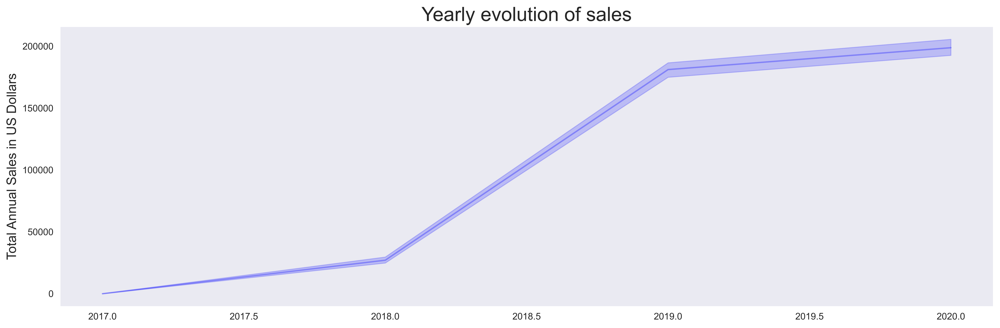

In [22]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.lineplot(data=filtered_df,x='year',y='total_annual_sales',color='blue',alpha=0.3)
plt.xlabel('',fontsize=14)
plt.ylabel('Total Annual Sales in US Dollars',fontsize=14)
plt.title('Yearly evolution of sales',fontsize=21)
plt.tight_layout()

plt.savefig('evolution_of_sales.png');


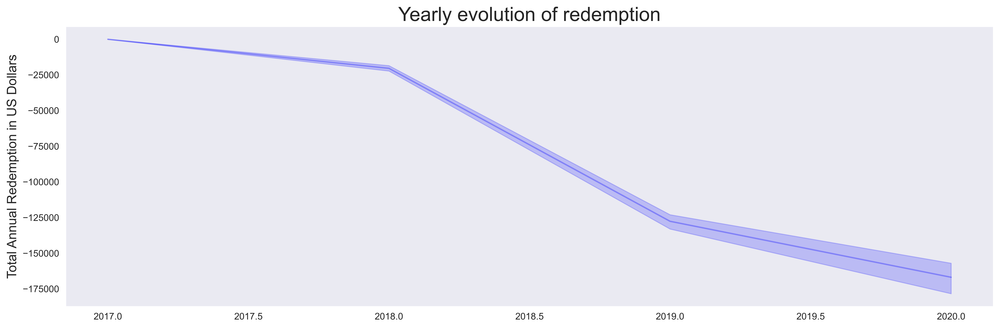

In [23]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.lineplot(data=filtered_df,x='year',y='total_annual_redemption',color='blue',alpha=0.3)
plt.xlabel('',fontsize=14)
plt.ylabel('Total Annual Redemption in US Dollars',fontsize=14)
plt.title('Yearly evolution of redemption',fontsize=21)
plt.tight_layout()

plt.savefig('evolution_of_redemption.png');


### Save the filtered excel file

In [24]:
filtered_df.to_excel('capstone.xlsx',columns=filtered_df.columns)
print('done saving the file...')

done saving the file...


# <span style='color:Magenta'> Work with the filtered and cleaned excel file </span>

### Read the filtered excel file

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
sns.set_style('dark')
import os

In [26]:
os.chdir('/Users/samuelchazy/ML_files_X/Capstone/Data')
#os.chdir('/Users/samuelchazy/EMA Aesthetics Dropbox/FAB info/ML_files_X/Capstone/Data')
os.getcwd()

'/Users/samuelchazy/ML_files_X/Capstone/Data'

In [27]:
df = pd.read_excel('capstone.xlsx')
print('Done reading the file...')

Done reading the file...


In [28]:
final_df = df.drop('Unnamed: 0',axis=1)
final_df

,year,month,ID,no_of_sales_12M_1,no_of_Redemption_12M_1,no_of_sales_12M_10K,no_of_Redemption_12M_10K,no_of_funds_sold_12M_1,no_of_funds_redeemed_12M_1,no_of_fund_sales_12M_10K,...,Firm ID_1576620,Firm ID_1688552,Firm ID_1735461,Firm ID_1816025,Firm ID_1948520,Firm ID_85201112683918276481,Firm ID_9000166,index_y,Sub channel_NACS,Sub channel_RIA
0,2017,12,0000286,2,0,0,0,1,0,0,...,0,0,0,0,1,0,0,4001,1,0
1,2018,1,0000286,3,0,0,0,2,0,0,...,0,0,0,0,1,0,0,4001,1,0
2,2018,2,0000286,3,0,0,0,2,0,0,...,0,0,0,0,1,0,0,4001,1,0
3,2018,3,0000286,3,0,0,0,2,0,0,...,0,0,0,0,1,0,0,4001,1,0
4,2018,4,0000286,3,0,0,0,2,0,0,...,0,0,0,0,1,0,0,4001,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360320,2020,7,85202171455580866976,11,3,4,0,3,2,1,...,0,0,0,0,0,0,0,5881,0,0
360321,2020,8,85202171455580866976,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,5881,0,0
360322,2020,9,85202171455580866976,0,2,0,0,0,1,0,...,0,0,0,0,0,0,0,5881,0,0
360323,2020,10,85202171455580866976,0,3,0,0,0,1,0,...,0,0,0,0,0,0,0,5881,0,0


### Drop advisors with less than 3 years observations combined
#### Filter the data based on year and month

In [29]:
temp_df = final_df.copy()
temp_df['count'] = np.zeros(len(temp_df))

# Years are shifted by -1 month in this data

temp_df.loc[(temp_df['year']==2018) & (temp_df['month']==11),'count']=1
temp_df.loc[(temp_df['year']==2019) & (temp_df['month']==11),'count']=1
temp_df.loc[(temp_df['year']==2020) & (temp_df['month']==11),'count']=1
temp_df = temp_df[temp_df['count']==1]
temp_df = temp_df.drop(['month', 'count'],axis=1)


#### Filter the data based on results having at least 3 years

In [30]:
temp_df['count'] = temp_df['ID'].map(temp_df['ID'].value_counts())
temp_df = temp_df[temp_df['count'] >= 3]
temp_df = temp_df.drop('count',axis=1)
advisors_df = temp_df.copy()
advisors_df


,year,ID,no_of_sales_12M_1,no_of_Redemption_12M_1,no_of_sales_12M_10K,no_of_Redemption_12M_10K,no_of_funds_sold_12M_1,no_of_funds_redeemed_12M_1,no_of_fund_sales_12M_10K,no_of_funds_Redemption_12M_10K,...,Firm ID_1576620,Firm ID_1688552,Firm ID_1735461,Firm ID_1816025,Firm ID_1948520,Firm ID_85201112683918276481,Firm ID_9000166,index_y,Sub channel_NACS,Sub channel_RIA
11,2018,0000286,2,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,4001,1,0
23,2019,0000286,1,0,1,0,1,0,1,0,...,0,0,0,0,1,0,0,4001,1,0
35,2020,0000286,2,1,0,0,1,1,0,0,...,0,0,0,0,1,0,0,4001,1,0
47,2018,0000422,0,2,0,0,0,1,0,0,...,0,1,0,0,0,0,0,3067,1,0
59,2019,0000422,0,2,0,0,0,1,0,0,...,0,1,0,0,0,0,0,3067,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360276,2019,85202171444412943677,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,9295,0,0
360288,2020,85202171444412943677,1,0,1,0,1,0,1,0,...,1,0,0,0,0,0,0,9295,0,0
360300,2018,85202171455580866976,3,5,0,0,2,4,0,0,...,0,0,0,0,0,0,0,5881,0,0
360312,2019,85202171455580866976,1,17,0,0,1,5,0,0,...,0,0,0,0,0,0,0,5881,0,0


### Split the Data into Holdout and Training set

In [31]:
training_data = advisors_df[advisors_df['year'] < 2020]
hold_out_data_df = advisors_df[advisors_df['year'] == 2020]

print(training_data.shape)
print(hold_out_data_df.shape)

(20000, 58)
(10000, 58)


### recompose the training data into 2018 variables + 'predicted' 2019 values(y)

In [32]:
# get the 'y' from the 2019 data
training_data_2019 = training_data[training_data['year']==2019][['ID','total_annual_sales']]
training_data_2019 = training_data_2019.rename(columns={'total_annual_sales':'y'})

# get the data from 2018
training_data_df = training_data[training_data['year']==2018]

# merge 2018 data with the 'y' from 2019
training_data_df = training_data_df.merge(training_data_2019,on='ID',how='inner')

# drop unnecessary columns
training_data_df = training_data_df.drop(['sales_curr','redemption_curr','year','index_y','index_x'],axis=1)

# set the index to 'ID'
training_data_df = training_data_df.set_index('ID')

training_data_df.head()

,no_of_sales_12M_1,no_of_Redemption_12M_1,no_of_sales_12M_10K,no_of_Redemption_12M_10K,no_of_funds_sold_12M_1,no_of_funds_redeemed_12M_1,no_of_fund_sales_12M_10K,no_of_funds_Redemption_12M_10K,no_of_assetclass_sold_12M_1,no_of_assetclass_redeemed_12M_1,...,Firm ID_1576620,Firm ID_1688552,Firm ID_1735461,Firm ID_1816025,Firm ID_1948520,Firm ID_85201112683918276481,Firm ID_9000166,Sub channel_NACS,Sub channel_RIA,y
ID,,,,,,,,,,,,,,,,,,,,,
0000286,2,0,0,0,1,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,9.298870e+04
0000422,0,2,0,0,0,1,0,0,0,1,...,0,1,0,0,0,0,0,1,0,-5.684342e-14
0000508,30,12,20,4,10,2,9,2,3,1,...,0,0,0,0,0,0,0,1,0,2.382043e+06
0000604,1,1,0,1,1,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,8.731149e-10
0000657,0,1,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,1,0,8.585630e-10


# Explore the distributions of the training & test sets

In [33]:
training_data_df['total_annual_sales'].describe()

count    1.000000e+04
mean     1.615029e+05
std      1.053128e+06
min     -5.783727e+04
25%     -3.609387e-09
50%      9.429641e-09
75%      2.800000e+04
max      5.359650e+07
Name: total_annual_sales, dtype: float64

### Explore the corrolation between the variables

In [34]:
corr_data = training_data_df.copy()
corr_data = corr_data.iloc[:,0:31]
corr_data


,no_of_sales_12M_1,no_of_Redemption_12M_1,no_of_sales_12M_10K,no_of_Redemption_12M_10K,no_of_funds_sold_12M_1,no_of_funds_redeemed_12M_1,no_of_fund_sales_12M_10K,no_of_funds_Redemption_12M_10K,no_of_assetclass_sold_12M_1,no_of_assetclass_redeemed_12M_1,...,aum_AC_REAL_ESTATE,aum_AC_TARGET,aum_P_529,aum_P_ALT,aum_P_CEF,aum_P_ETF,aum_P_MF,aum_P_SMA,aum_P_UCITS,aum_P_UIT
ID,,,,,,,,,,,,,,,,,,,,,
0000286,2,0,0,0,1,0,0,0,1,0,...,0.0,0.0,0.0,0.0,15930.90675,0.0,1.724946e+04,-4.573492e+05,0.0,0.000
0000422,0,2,0,0,0,1,0,0,0,1,...,0.0,0.0,0.0,0.0,0.00000,0.0,-4.113164e+05,0.000000e+00,0.0,0.000
0000508,30,12,20,4,10,2,9,2,3,1,...,0.0,0.0,0.0,0.0,0.00000,0.0,2.039494e+06,1.134864e+06,0.0,675358.965
0000604,1,1,0,1,1,1,0,1,1,1,...,0.0,0.0,0.0,0.0,0.00000,0.0,1.549993e+06,0.000000e+00,0.0,0.000
0000657,0,1,0,0,0,1,0,0,0,1,...,0.0,0.0,0.0,0.0,194024.25000,0.0,-2.876868e+04,0.000000e+00,0.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85202171285268924631,3,0,3,0,3,0,3,0,2,0,...,0.0,0.0,0.0,0.0,0.00000,0.0,3.747900e+05,0.000000e+00,0.0,0.000
85202171385039349401,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.00000,0.0,0.000000e+00,0.000000e+00,0.0,0.000
85202171385367383048,1,1,0,0,1,1,0,0,1,1,...,0.0,0.0,0.0,0.0,0.00000,0.0,-2.506419e+04,0.000000e+00,0.0,0.000


In [35]:
fig,ax = plt.subplots(figsize=(15,12),dpi=600)
ax = sns.heatmap(data=corr_data.corr(),annot=True,annot_kws={'fontsize':6},cmap='PuRd')
plt.title('Independant Variables Corrolation Matrix',fontsize=14)
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('Features_corr.jpg');


In [36]:
print('There is a very high corrolation betweeen aum_P_ALT & aum_AC_REAL_ESTAE, so we will drop one of them')

training_data_df = training_data_df.drop('aum_P_ALT',axis=1)

There is a very high corrolation betweeen aum_P_ALT & aum_AC_REAL_ESTAE, so we will drop one of them


## Construct a descision tree model to subdivide the training data into 3 categories based on the total annual sales

In [37]:
training_data_tree = training_data_df.loc[:,['total_annual_sales','y']]
tree_train = training_data_tree.copy()

X_tree = tree_train.drop('y',axis=1)
y_tree = tree_train['y']

from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X_tree,y_tree,test_size=0.25,random_state=20,shuffle=True)
model = DecisionTreeRegressor(criterion='mae',max_depth=3)
model.fit(X_train,y_train)

ax,fig = plt.subplots(figsize=(15,10),dpi=600)
ax = tree.plot_tree(model,filled=True,fontsize=12)

plt.tight_layout()
plt.savefig('tree.png');

In [38]:
low_training_data_df = training_data_df[training_data_df['total_annual_sales'] <= 40000]
mid_training_data_df = training_data_df[(training_data_df['total_annual_sales'] > 40000)&(training_data_df['total_annual_sales'] < 200000)]
high_training_data_df = training_data_df[training_data_df['total_annual_sales'] >= 200000]

print(f'low_bound: {low_training_data_df.shape[0]} advisors')
print(f'mid_bound: {mid_training_data_df.shape[0]} advisors')
print(f'high_bound: {high_training_data_df.shape[0]} advisors')

low_bound: 7732 advisors
mid_bound: 1119 advisors
high_bound: 1149 advisors


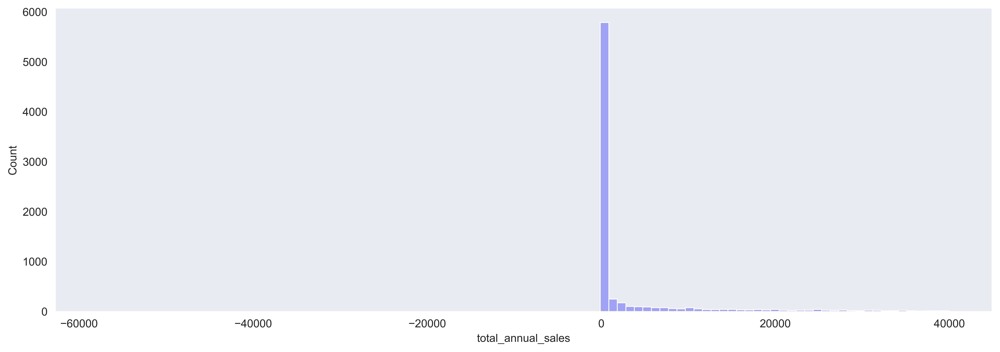

In [39]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(data=low_training_data_df['total_annual_sales'],bins=100,color='blue',alpha=0.3)


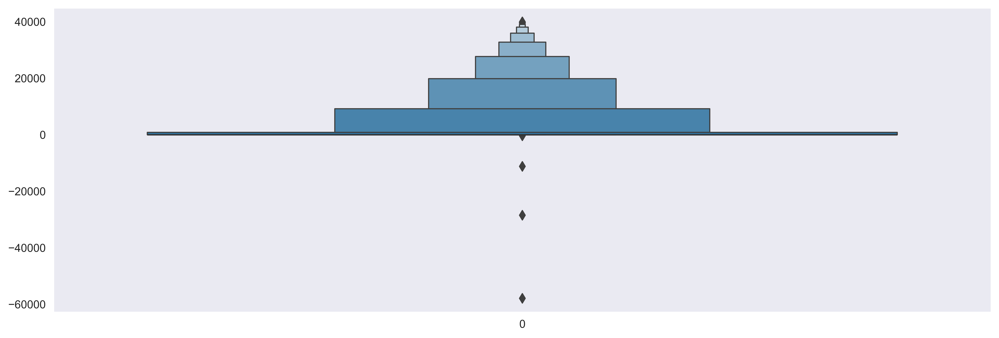

In [40]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.boxenplot(data=low_training_data_df['total_annual_sales'])

In [41]:
# low_training_data_df[low_training_data_df['total_annual_sales'] < 0]['total_annu al_sales'].dropna()

In [42]:
below_zero = low_training_data_df[low_training_data_df['total_annual_sales'] < 0]['total_annual_sales'].dropna()
low_training_data_df = low_training_data_df.drop(below_zero.index,axis=0)


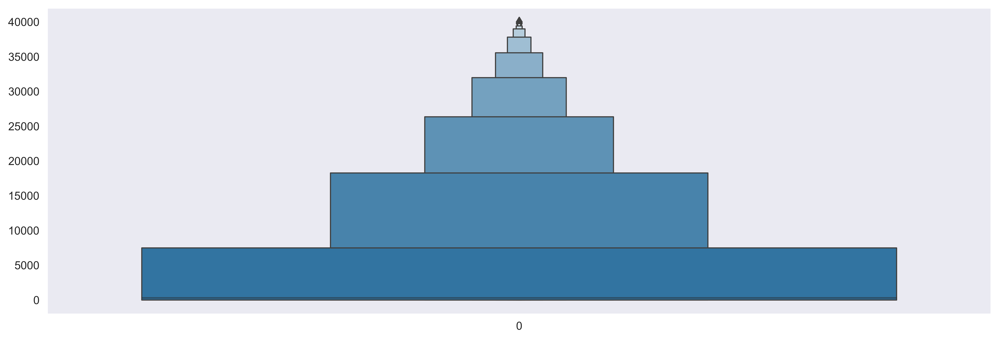

In [43]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.boxenplot(data=low_training_data_df['total_annual_sales'])

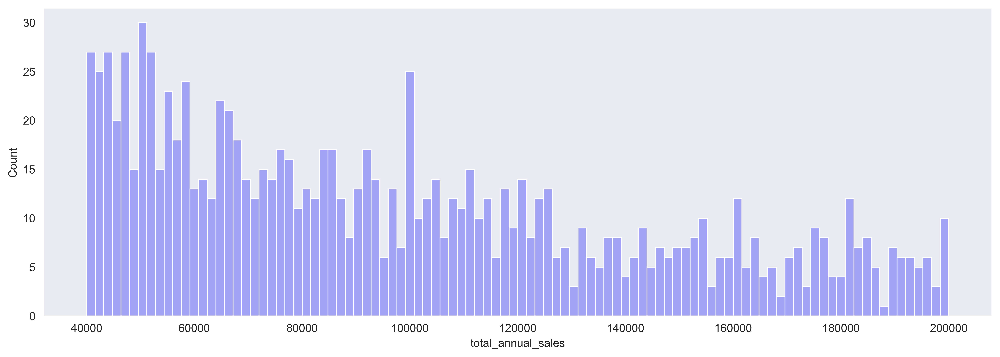

In [44]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(data=mid_training_data_df['total_annual_sales'],bins=100,color='blue',alpha=0.3)

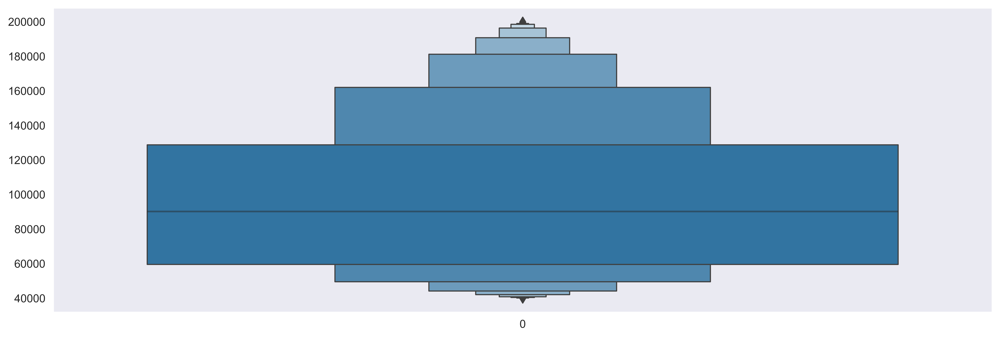

In [45]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.boxenplot(data=mid_training_data_df['total_annual_sales'])

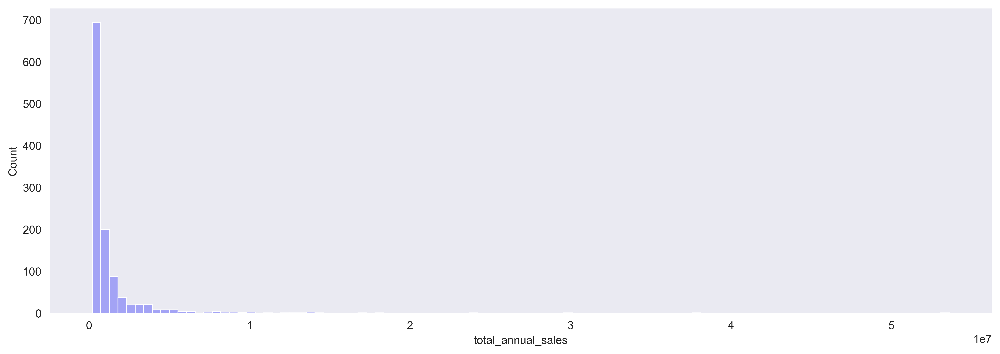

In [46]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(data=high_training_data_df['total_annual_sales'],bins=100,color='blue',alpha=0.3)

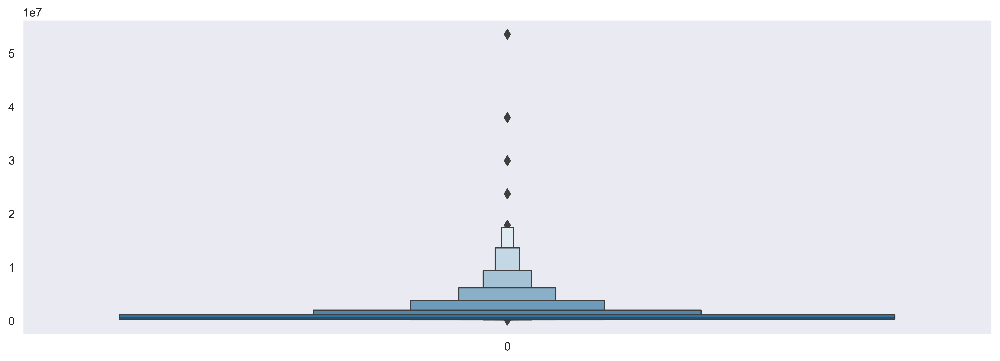

In [47]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.boxenplot(data=high_training_data_df['total_annual_sales'])

In [48]:
# high_training_data_df[high_training_data_df['total_annual_sales'] > 15000000]['total_annual_sales'].dropna()

In [49]:
# outliers = high_training_data_df[high_training_data_df['total_annual_sales'] > 15000000]['total_annual_sales'].dropna()
# high_training_data_df = high_training_data_df.drop(outliers.index,axis=0)


In [50]:
# ax,fig = plt.subplots(figsize=(15,5),dpi=600)
# ax = sns.boxenplot(data=high_training_data_df['total_annual_sales'])

## Standardize the 3 DataFrames

In [51]:
low_training_data_norm = low_training_data_df.copy()
mid_training_data_norm = mid_training_data_df.copy()
high_training_data_norm = high_training_data_df.copy()

from sklearn.preprocessing import StandardScaler

def to_norm(data):
    scaler = StandardScaler().fit_transform(data.iloc[:,0:32])
    data.iloc[:,0:32] = scaler
    return data


In [52]:
low_training_data_norm = to_norm(low_training_data_norm)
mid_training_data_norm = to_norm(mid_training_data_norm)
high_training_data_norm = to_norm(high_training_data_norm)


## Plot the variables of each category

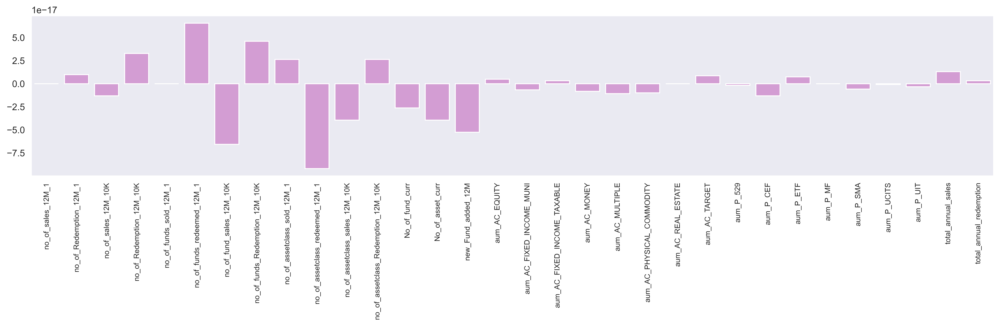

In [53]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.barplot(data=low_training_data_norm.iloc[:,:32],ci=None,color='Violet',saturation=0.5)
plt.xticks(fontsize=8,rotation=90)

plt.tight_layout()
plt.savefig('low_training_data_df.png');

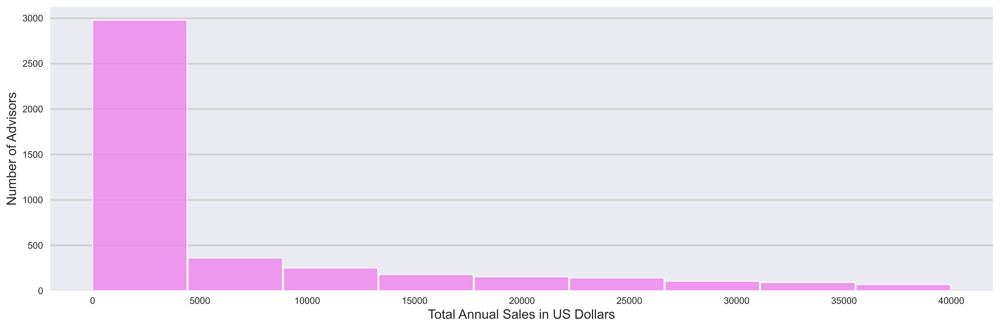

In [54]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=low_training_data_df['total_annual_sales'],
                  bins=9,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Total Annual Sales in US Dollars',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('low_annual_sales.png');

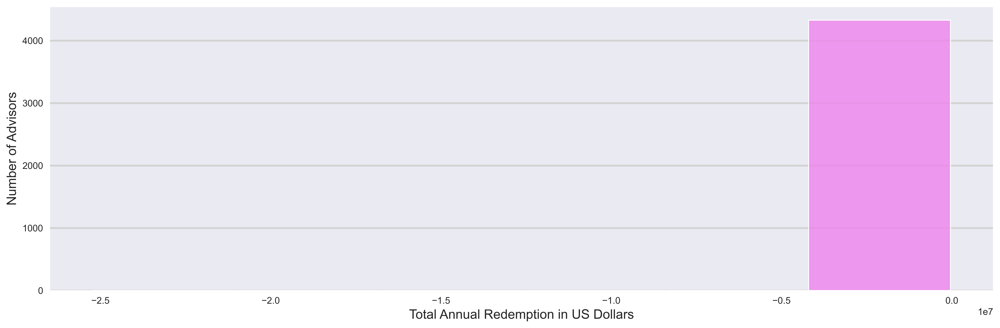

In [55]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=low_training_data_df['total_annual_redemption'],
                  bins=6,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Total Annual Redemption in US Dollars',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('low_annual_redemption.png');

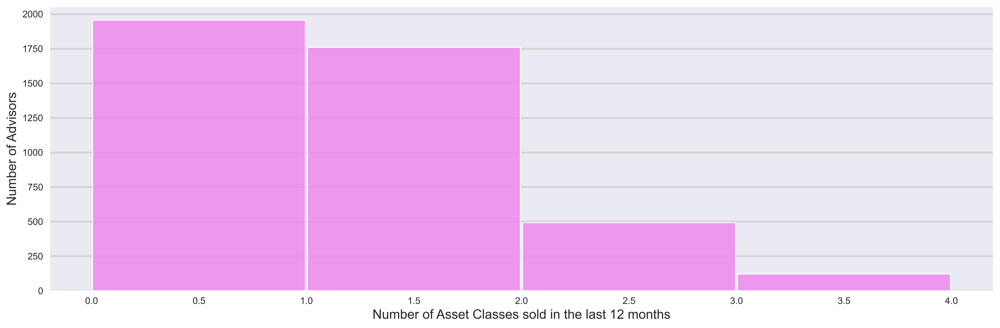

In [56]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=low_training_data_df['no_of_assetclass_sold_12M_1'],
                  bins=4,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Number of Asset Classes sold in the last 12 months',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('low_assetclass.png');

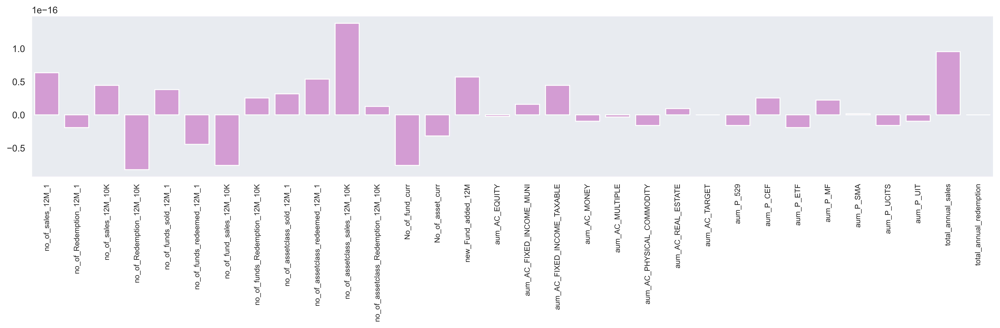

In [57]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.barplot(data=mid_training_data_norm.iloc[:,:32],ci=None,color='Violet',saturation=0.5)
plt.xticks(fontsize=8,rotation=90)

plt.tight_layout()
plt.savefig('mid_training_data_df.png');

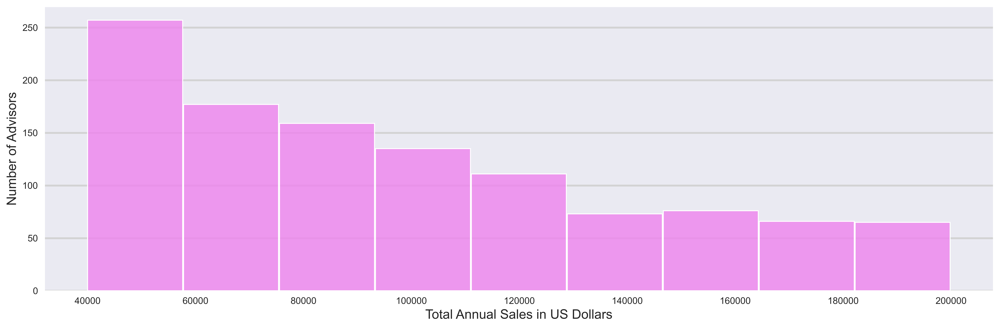

In [58]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=mid_training_data_df['total_annual_sales'],
                  bins=9,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Total Annual Sales in US Dollars',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('mid_annual_sales.png');

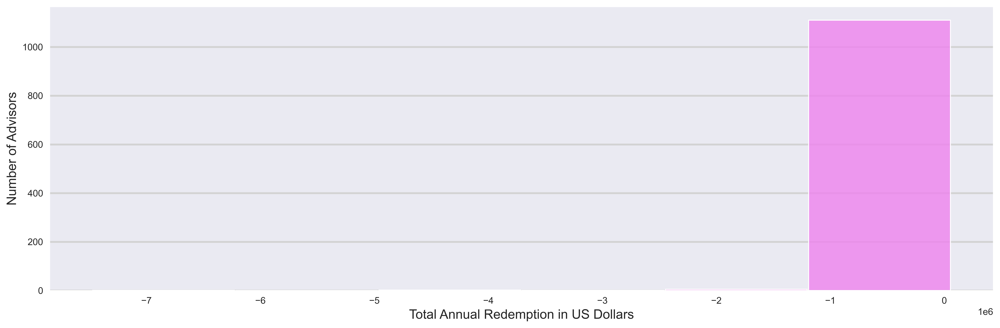

In [59]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=mid_training_data_df['total_annual_redemption'],
                  bins=6,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Total Annual Redemption in US Dollars',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('mid_annual_redemption.png');

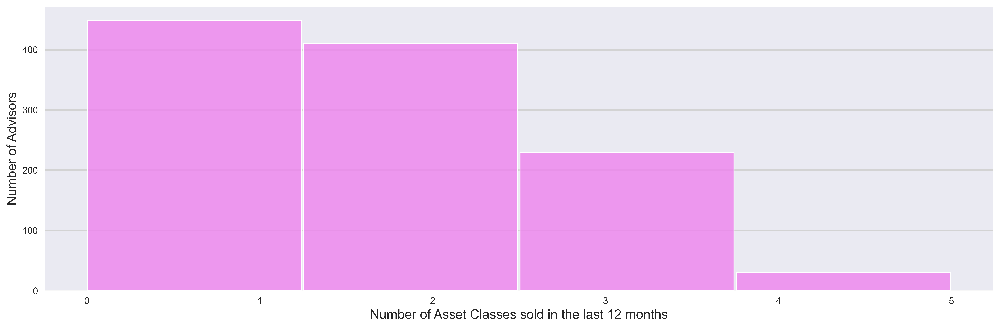

In [60]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=mid_training_data_df['no_of_assetclass_sold_12M_1'],
                  bins=4,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Number of Asset Classes sold in the last 12 months',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('mid_assetclass.png');

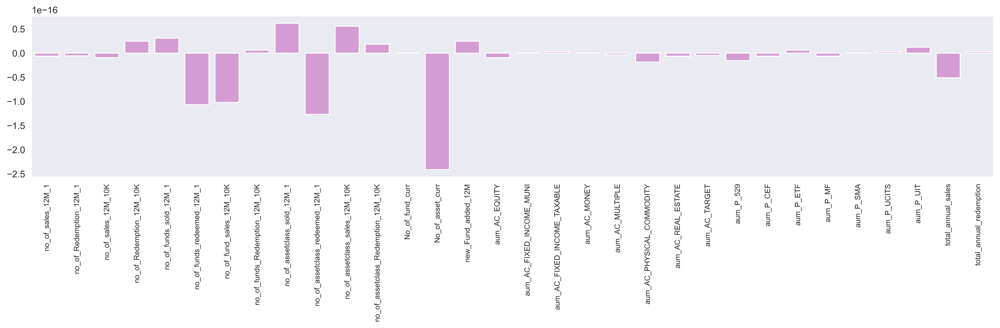

In [61]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.barplot(data=high_training_data_norm.iloc[:,:32],ci=None,color='Violet',saturation=0.5)
plt.xticks(fontsize=8,rotation=90)

plt.tight_layout()
plt.savefig('high_training_data_df.png');

In [62]:
# high_training_data_norm[high_training_data_norm['total_annual_sales']<1000000]['total_annual_sales']

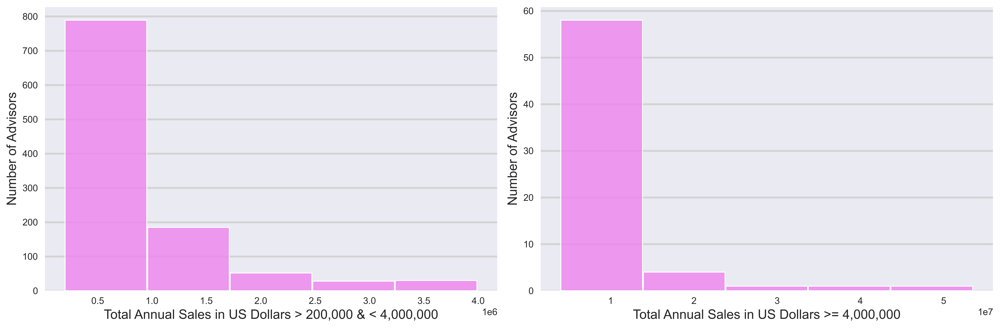

In [63]:
decile1 = high_training_data_df[high_training_data_df['total_annual_sales']<4000000]
decile2 = high_training_data_df[high_training_data_df['total_annual_sales']>=4000000]

fig,[ax1,ax2] = plt.subplots(1,2,figsize=(15,5),dpi=600)

ax1 = sns.histplot(ax=ax1,x=decile1['total_annual_sales'],
                  bins=5,color='Violet',alpha=0.8,shrink=0.99)

ax1.set_xlabel(xlabel='Total Annual Sales in US Dollars > 200,000 & < 4,000,000',fontsize=14)
ax1.set_ylabel(ylabel='Number of Advisors',fontsize=14)
ax1.grid(axis='y',linewidth=2,color='lightgrey')

ax2 = sns.histplot(ax=ax2,x=decile2['total_annual_sales'],
                  bins=5,color='Violet',alpha=0.8,shrink=0.99)

ax2.set_xlabel(xlabel='Total Annual Sales in US Dollars >= 4,000,000',fontsize=14)
ax2.set_ylabel(ylabel='Number of Advisors',fontsize=14)
ax2.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('high_annual_sales.png');

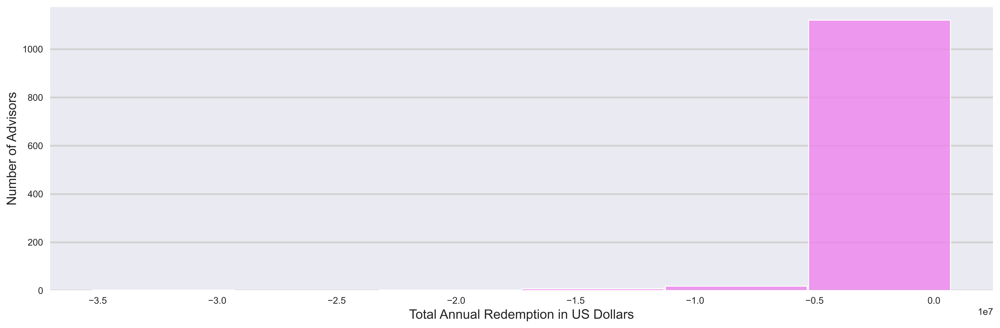

In [64]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=high_training_data_df['total_annual_redemption'],
                  bins=6,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Total Annual Redemption in US Dollars',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('high_annual_redemption.png');

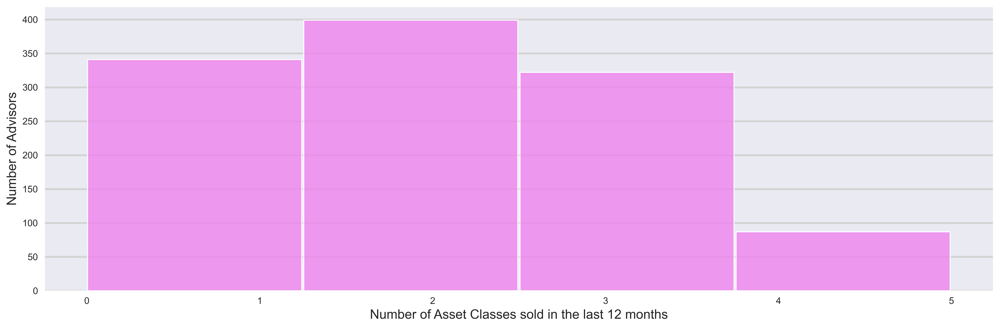

In [65]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.histplot(x=high_training_data_df['no_of_assetclass_sold_12M_1'],
                  bins=4,color='Violet',alpha=0.8,shrink=0.99)

plt.xlabel('Number of Asset Classes sold in the last 12 months',fontsize=14)
plt.ylabel('Number of Advisors',fontsize=14)
plt.grid(axis='y',linewidth=2,color='lightgrey')

plt.tight_layout()
plt.savefig('high_assetclass.png');

### Model Baseline Evaluation

In [66]:
eval_model = pd.DataFrame(data={'loss':['low_mse','mid_mse','high_mse'],
                                'baseline':np.zeros(3),
                                'lasso':np.zeros(3),
                                'gbdt':np.zeros(3),
                                'rfr':np.zeros(3)})

low_y = low_training_data_norm['y']
mid_y = mid_training_data_norm['y']
high_y = high_training_data_norm['y']

low_yhat = low_training_data_norm['total_annual_sales']
mid_yhat = mid_training_data_norm['total_annual_sales']
high_yhat = high_training_data_norm['total_annual_sales']

mse_base_low = np.mean(np.square(low_y - low_yhat))
mse_base_mid = np.mean(np.square(mid_y - mid_yhat))
mse_base_high = np.mean(np.square(high_y - high_yhat))

eval_model.loc[0,'baseline'] = mse_base_low
eval_model.loc[1,'baseline'] = mse_base_mid
eval_model.loc[2,'baseline'] = mse_base_high

eval_model

,loss,baseline,lasso,gbdt,rfr
0,low_mse,1.491800e+11,0.0,0.0,0.0
1,mid_mse,3.085786e+11,0.0,0.0,0.0
2,high_mse,9.183839e+12,0.0,0.0,0.0


### Apply L1(Lasso) regularization to the data and find the best alpha parameter

In [67]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error

In [68]:
# Split the data

low_training_data_norm_X = low_training_data_norm.drop('y',axis=1)
low_training_data_norm_y = low_training_data_norm['y']

mid_training_data_norm_X = mid_training_data_norm.drop('y',axis=1)
mid_training_data_norm_y = mid_training_data_norm['y']

high_training_data_norm_X = high_training_data_norm.drop('y',axis=1)
high_training_data_norm_y = high_training_data_norm['y']


### Build the Lasso Models

In [69]:
# Build the low_model

low_lasso = LassoCV(cv=3,max_iter=100000,fit_intercept=False,normalize=True,random_state=20)
low_lasso.fit(low_training_data_norm_X,low_training_data_norm_y)
print(list(low_lasso.coef_))

# Find the selected variables names
print('-'*80)
print('Columns with values > 0:')
print('-'*80)
cols = low_training_data_norm.columns.drop('y')
cols = list(cols[low_lasso.coef_ > 0])
print(cols)
print('-'*80)
low_training_data_norm_y_predicted = low_lasso.predict(low_training_data_norm_X)
mse_lasso_low = round(np.sqrt(mean_squared_error(low_training_data_norm_y,low_training_data_norm_y_predicted)),0)
print(f'MSE: {mse_lasso_low}')
print('-'*80)

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.0, 0.0, 0.0, -0.0, 0.0, 0.0, 0.0, -0.0, -0.0, 0.0, -0.0, 0.0, 0.0, -0.0, 0.0, 0.0, -0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
--------------------------------------------------------------------------------
Columns with values > 0:
--------------------------------------------------------------------------------
[]
--------------------------------------------------------------------------------
MSE: 386238.0
--------------------------------------------------------------------------------


In [70]:
# Build the mid_model

mid_lasso = LassoCV(cv=3,max_iter=100000,fit_intercept=False,normalize=True,random_state=20)
mid_lasso.fit(mid_training_data_norm_X,mid_training_data_norm_y)
print(list(mid_lasso.coef_))

# Find the selected variables names
print('-'*80)
print('Columns with values > 0:')
print('-'*80)
cols = mid_training_data_norm.columns.drop('y')
cols = list(cols[mid_lasso.coef_ > 0])
print(cols)
print('-'*80)
mid_training_data_norm_y_predicted = mid_lasso.predict(mid_training_data_norm_X)
mse_lasso_mid = round(np.sqrt(mean_squared_error(mid_training_data_norm_y,mid_training_data_norm_y_predicted)),0)
print(f'MSE: {mse_lasso_mid}')
print('-'*80)

[0.0, -0.0, 5937.952169324324, 0.0, 0.0, -0.0, 0.0, 15050.047166413604, -0.0, -0.0, -0.0, 15872.233244062276, 8238.869539585607, 0.0, 189.28550124068852, 26826.274575687796, 0.0, 0.0, -0.0, -0.0, -5669.2348300036565, -2423.2322128339897, 0.0, 0.0, -0.0, -0.0, 11706.559421722164, 0.0, -0.0, -9982.511817302291, 0.0, -0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.0, 0.0, 0.0, -0.0, 0.0, -0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 215574.2521634285, 0.0]
--------------------------------------------------------------------------------
Columns with values > 0:
--------------------------------------------------------------------------------
['no_of_sales_12M_10K', 'no_of_funds_Redemption_12M_10K', 'no_of_assetclass_Redemption_12M_10K', 'No_of_fund_curr', 'new_Fund_added_12M', 'aum_AC_EQUITY', 'aum_P_MF', 'Sub channel_NACS']
--------------------------------------------------------------------------------
MSE: 527137.0
--------------------------------------------------------------------------------


In [71]:
# Build the high_model

high_lasso = LassoCV(cv=3,max_iter=100000,fit_intercept=False,normalize=True,random_state=20)
high_lasso.fit(high_training_data_norm_X,high_training_data_norm_y)
print(list(high_lasso.coef_))

# Find the selected variables names
print('-'*80)
print('Columns with values > 0:')
print('-'*80)
cols = high_training_data_norm.columns.drop('y')
cols = list(cols[high_lasso.coef_ > 0])
print(cols)
print('-'*80)
high_training_data_norm_y_predicted = high_lasso.predict(high_training_data_norm_X)
mse_lasso_high = round(np.sqrt(mean_squared_error(high_training_data_norm_y,high_training_data_norm_y_predicted)),0)
print(f'MSE: {mse_lasso_high}')
print('-'*80)

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 57933.82175026049, 281850.7017072943, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.0, 928834.3245448251, -0.0, 0.0, 0.0, 0.0, -0.0, 354989.13233989314, -0.0, 0.0, 0.0, 0.0, -0.0, -0.0, -0.0, 542360.6179515071, -102786.57143108161, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 729957.4601897217, 0.0]
--------------------------------------------------------------------------------
Columns with values > 0:
--------------------------------------------------------------------------------
['no_of_fund_sales_12M_10K', 'no_of_funds_Redemption_12M_10K', 'aum_AC_FIXED_INCOME_MUNI', 'aum_AC_TARGET', 'total_annual_sales', 'Sub channel_NACS']
--------------------------------------------------------------------------------
MSE: 2179822.0
--------------------------------------------------------------------------------


### Model Lasso Evaluation

In [72]:
low_lasso_yhat = low_lasso.predict(low_training_data_norm_X)
mid_lasso_yhat = mid_lasso.predict(mid_training_data_norm_X)
high_lasso_yhat = high_lasso.predict(high_training_data_norm_X)

mse_lasso_low = np.mean(np.square(low_y - low_lasso_yhat))
mse_lasso_mid = np.mean(np.square(mid_y - mid_lasso_yhat))
mse_lasso_high = np.mean(np.square(high_y - high_lasso_yhat))

eval_model.loc[0,'lasso'] = mse_lasso_low
eval_model.loc[1,'lasso'] = mse_lasso_mid
eval_model.loc[2,'lasso'] = mse_lasso_high

eval_model


,loss,baseline,lasso,gbdt,rfr
0,low_mse,1.491800e+11,1.491800e+11,0.0,0.0
1,mid_mse,3.085786e+11,2.778732e+11,0.0,0.0
2,high_mse,9.183839e+12,4.751624e+12,0.0,0.0


### Build a Gredient Boost Regressor model

In [73]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score

In [74]:
def gbdt(params,X,y):
    min_params={'lrs':0,'n_ests':0,'subsamps':0,'maxdepths':0,'maxfeats':0}
    min_mse = np.Inf
    
    for lr in params['lrs']:
        for n_est in params['n_ests']:
            for subsamp in params['subsamps']:
                for maxdepth in params['maxdepths']:
                    for maxfeat in params['maxfeats']:
                        print(f'lr: {lr}')
                        print(f'n_est: {n_est}')
                        print(f'subsamp: {subsamp}')
                        print(f'maxdepth: {maxdepth}')
                        print(f'maxfeat: {maxfeat}')
                        print('-'*80)
                        
                        gbdt = GradientBoostingRegressor(learning_rate=lr,
                                                          n_estimators=n_est,
                                                          subsample   =subsamp,
                                                          max_depth   =maxdepth,
                                                          max_features=maxfeat)
                        scores=cross_val_score(gbdt,X,y,
                                scoring='neg_mean_squared_error',
                                cv=3,error_score='raise')
                        scores=scores*-1
                        print('mse'+str(np.mean(scores))+'\n')
                        if np.mean(scores)<min_mse:
                            min_mse=np.mean(scores)
                            min_params['lrs']     =lr
                            min_params['n_ests']  =n_est
                            min_params['subsamps']=subsamp
                            min_params['maxdepths']=maxdepth
                            min_params['maxfeats']=maxfeat
    return min_params


In [75]:
params={'lrs':[0.0001],
       'n_ests':[2500,3500],
       'subsamps':[0.9,0.95],
       'maxdepths':[2,3],
       'maxfeats':[6,8]}

In [76]:
low_params_gbdt = gbdt(params,low_training_data_norm_X,low_training_data_norm_y)
print('Done...')

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 2
maxfeat: 6
--------------------------------------------------------------------------------
mse145574679001.8771

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 2
maxfeat: 8
--------------------------------------------------------------------------------
mse145578349812.62375

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 3
maxfeat: 6
--------------------------------------------------------------------------------
mse145537396042.20834

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 3
maxfeat: 8
--------------------------------------------------------------------------------
mse145570001500.43448

lr: 0.0001
n_est: 2500
subsamp: 0.95
maxdepth: 2
maxfeat: 6
--------------------------------------------------------------------------------
mse145606258560.08902

lr: 0.0001
n_est: 2500
subsamp: 0.95
maxdepth: 2
maxfeat: 8
--------------------------------------------------------------------------------
mse145599922612.49985

lr: 0.0001
n_est: 250

In [77]:
mid_params_gbdt = gbdt(params,mid_training_data_norm_X,mid_training_data_norm_y)
print('Done...')

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 2
maxfeat: 6
--------------------------------------------------------------------------------
mse271697969785.14282

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 2
maxfeat: 8
--------------------------------------------------------------------------------
mse271628508680.74576

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 3
maxfeat: 6
--------------------------------------------------------------------------------
mse271229167413.74475

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 3
maxfeat: 8
--------------------------------------------------------------------------------
mse271216555470.41003

lr: 0.0001
n_est: 2500
subsamp: 0.95
maxdepth: 2
maxfeat: 6
--------------------------------------------------------------------------------
mse271834356755.23972

lr: 0.0001
n_est: 2500
subsamp: 0.95
maxdepth: 2
maxfeat: 8
--------------------------------------------------------------------------------
mse271652797307.8217

lr: 0.0001
n_est: 250

In [78]:
high_params_gbdt = gbdt(params,high_training_data_norm_X,high_training_data_norm_y)
print('Done...')

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 2
maxfeat: 6
--------------------------------------------------------------------------------
mse7287947156145.898

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 2
maxfeat: 8
--------------------------------------------------------------------------------
mse7248531641705.442

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 3
maxfeat: 6
--------------------------------------------------------------------------------
mse7162059356983.878

lr: 0.0001
n_est: 2500
subsamp: 0.9
maxdepth: 3
maxfeat: 8
--------------------------------------------------------------------------------
mse7112806644566.903

lr: 0.0001
n_est: 2500
subsamp: 0.95
maxdepth: 2
maxfeat: 6
--------------------------------------------------------------------------------
mse7295181900723.649

lr: 0.0001
n_est: 2500
subsamp: 0.95
maxdepth: 2
maxfeat: 8
--------------------------------------------------------------------------------
mse7249344979771.782

lr: 0.0001
n_est: 2500
sub

In [79]:
# Save the best parameters

low_gbdt = GradientBoostingRegressor(learning_rate =low_params_gbdt['lrs'],
                                     n_estimators  =low_params_gbdt['n_ests'],
                                     subsample     =low_params_gbdt['subsamps'],
                                     max_depth     =low_params_gbdt['maxdepths'],
                                     max_features  =low_params_gbdt['maxfeats'])
low_gbdt.fit(low_training_data_norm_X,low_training_data_norm_y)

mid_gbdt = GradientBoostingRegressor(learning_rate =mid_params_gbdt['lrs'],
                                     n_estimators  =mid_params_gbdt['n_ests'],
                                     subsample     =mid_params_gbdt['subsamps'],
                                     max_depth     =mid_params_gbdt['maxdepths'],
                                     max_features  =mid_params_gbdt['maxfeats'])
mid_gbdt.fit(mid_training_data_norm_X,mid_training_data_norm_y)

high_gbdt = GradientBoostingRegressor(learning_rate=high_params_gbdt['lrs'],
                                     n_estimators  =high_params_gbdt['n_ests'],
                                     subsample     =high_params_gbdt['subsamps'],
                                     max_depth     =high_params_gbdt['maxdepths'],
                                     max_features  =high_params_gbdt['maxfeats'])
high_gbdt.fit(high_training_data_norm_X,high_training_data_norm_y)


GradientBoostingRegressor(learning_rate=0.0001, max_features=8,
                          n_estimators=3500, subsample=0.95)

In [80]:
low_gbdt

GradientBoostingRegressor(learning_rate=0.0001, max_features=8,
                          n_estimators=3500, subsample=0.9)

In [81]:
mid_gbdt

GradientBoostingRegressor(learning_rate=0.0001, max_features=8,
                          n_estimators=3500, subsample=0.9)

In [82]:
high_gbdt

GradientBoostingRegressor(learning_rate=0.0001, max_features=8,
                          n_estimators=3500, subsample=0.95)

### Model GBDT Evaluation

In [83]:
low_gbdt_yhat = low_gbdt.predict(low_training_data_norm_X)
mid_gbdt_yhat = mid_gbdt.predict(mid_training_data_norm_X)
high_gbdt_yhat = high_gbdt.predict(high_training_data_norm_X)

mse_gbdt_low = np.mean(np.square(low_y - low_gbdt_yhat))
mse_gbdt_mid = np.mean(np.square(mid_y - mid_gbdt_yhat))
mse_gbdt_high = np.mean(np.square(high_y - high_gbdt_yhat))

eval_model.loc[0,'gbdt'] = mse_gbdt_low
eval_model.loc[1,'gbdt'] = mse_gbdt_mid
eval_model.loc[2,'gbdt'] = mse_gbdt_high

eval_model

,loss,baseline,lasso,gbdt,rfr
0,low_mse,1.491800e+11,1.491800e+11,1.270646e+11,0.0
1,mid_mse,3.085786e+11,2.778732e+11,2.446975e+11,0.0
2,high_mse,9.183839e+12,4.751624e+12,5.810936e+12,0.0


### Build a Random Forest model

In [84]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score


In [85]:
def rfr(params,X,y):
    min_params={'max_samples':0,'n_ests':0,'max_leaf_nodes':0,'maxdepths':0,'maxfeats':'0'}
    min_mse = np.Inf
    i=0
    
    for max_sample in params['max_samples']:
        for n_est in params['n_ests']:
            for max_leaf_node in params['max_leaf_nodes']:
                for maxdepth in params['maxdepths']:
                    for maxfeat in params['maxfeats']:
                        print(f'max_sample: {max_sample}')
                        print(f'n_est: {n_est}')
                        print(f'max_leaf_node: {max_leaf_node}')
                        print(f'maxdepth: {maxdepth}')
                        print(f'maxfeat: {maxfeat}')
                        print('-'*80)
                        
                        rfr = RandomForestRegressor(max_samples   =max_sample,
                                                    n_estimators  =n_est,
                                                    max_leaf_nodes=max_leaf_node,
                                                    max_depth     =maxdepth,
                                                    max_features  =maxfeat)
                        scores=cross_val_score(rfr,X,y,
                                scoring='neg_mean_squared_error',
                                cv=3,error_score='raise')
                        scores=scores*-1
                        i+=1
                        print(f'{i}: mse: {str(np.mean(scores))}\n')
                        if np.mean(scores)<min_mse:
                            min_mse=np.mean(scores)
                            min_params['max_samples']   =max_sample
                            min_params['n_ests']        =n_est
                            min_params['max_leaf_nodes']=max_leaf_node
                            min_params['maxdepths']     =maxdepth
                            min_params['maxfeats']      =maxfeat
    return min_params


In [86]:
params={'max_samples':[0.5,0.8],
       'n_ests':[2500,3500],
       'max_leaf_nodes':[8,10],
       'maxdepths':[3],
       'maxfeats':['sqrt']}

In [87]:
low_params_rfr = rfr(params,low_training_data_norm_X,low_training_data_norm_y)
print('Done...')

max_sample: 0.5
n_est: 2500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
1: mse: 145252105147.53714

max_sample: 0.5
n_est: 2500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
2: mse: 145529083680.82156

max_sample: 0.5
n_est: 3500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
3: mse: 145253660771.79562

max_sample: 0.5
n_est: 3500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
4: mse: 145488329650.25888

max_sample: 0.8
n_est: 2500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
5: mse: 146271009094.6925

max_sample: 0.8
n_est: 2500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
---------------------------

In [88]:
mid_params_rfr = rfr(params,mid_training_data_norm_X,mid_training_data_norm_y)
print('Done...')

max_sample: 0.5
n_est: 2500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
1: mse: 268849560132.22693

max_sample: 0.5
n_est: 2500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
2: mse: 268180853779.73166

max_sample: 0.5
n_est: 3500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
3: mse: 268566041537.77963

max_sample: 0.5
n_est: 3500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
4: mse: 268530836671.11072

max_sample: 0.8
n_est: 2500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
5: mse: 268347658221.6068

max_sample: 0.8
n_est: 2500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
---------------------------

In [89]:
high_params_rfr = rfr(params,high_training_data_norm_X,high_training_data_norm_y)
print('Done...')

max_sample: 0.5
n_est: 2500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
1: mse: 5753316850632.953

max_sample: 0.5
n_est: 2500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
2: mse: 5742516686951.129

max_sample: 0.5
n_est: 3500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
3: mse: 5727706535178.956

max_sample: 0.5
n_est: 3500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
4: mse: 5765990816574.556

max_sample: 0.8
n_est: 2500
max_leaf_node: 8
maxdepth: 3
maxfeat: sqrt
--------------------------------------------------------------------------------
5: mse: 5808445756859.441

max_sample: 0.8
n_est: 2500
max_leaf_node: 10
maxdepth: 3
maxfeat: sqrt
-------------------------------

In [90]:
# Save the best parameters

low_rfr = RandomForestRegressor(     max_samples   =low_params_rfr['max_samples'],
                                     n_estimators  =low_params_rfr['n_ests'],
                                     max_leaf_nodes=low_params_rfr['max_leaf_nodes'],
                                     max_depth     =low_params_rfr['maxdepths'],
                                     max_features  =low_params_rfr['maxfeats'])
low_rfr.fit(low_training_data_norm_X,low_training_data_norm_y)

mid_rfr = RandomForestRegressor(     max_samples   =mid_params_rfr['max_samples'],
                                     n_estimators  =mid_params_rfr['n_ests'],
                                     max_leaf_nodes=mid_params_rfr['max_leaf_nodes'],
                                     max_depth     =mid_params_rfr['maxdepths'],
                                     max_features  =mid_params_rfr['maxfeats'])
mid_rfr.fit(mid_training_data_norm_X,mid_training_data_norm_y)

high_rfr = RandomForestRegressor(     max_samples  =high_params_rfr['max_samples'],
                                     n_estimators  =high_params_rfr['n_ests'],
                                     max_leaf_nodes=high_params_rfr['max_leaf_nodes'],
                                     max_depth     =high_params_rfr['maxdepths'],
                                     max_features  =high_params_rfr['maxfeats'])
high_rfr.fit(high_training_data_norm_X,high_training_data_norm_y)


RandomForestRegressor(max_depth=3, max_features='sqrt', max_leaf_nodes=8,
                      max_samples=0.5, n_estimators=3500)

### Model Random Forest Evaluation

In [91]:
low_rfr_yhat = low_rfr.predict(low_training_data_norm_X)
mid_rfr_yhat = mid_rfr.predict(mid_training_data_norm_X)
high_rfr_yhat = high_rfr.predict(high_training_data_norm_X)

mse_rfr_low = np.mean(np.square(low_y - low_rfr_yhat))
mse_rfr_mid = np.mean(np.square(mid_y - mid_rfr_yhat))
mse_rfr_high = np.mean(np.square(high_y - high_rfr_yhat))

eval_model.loc[0,'rfr'] = mse_rfr_low
eval_model.loc[1,'rfr'] = mse_rfr_mid
eval_model.loc[2,'rfr'] = mse_rfr_high

eval_model

,loss,baseline,lasso,gbdt,rfr
0,low_mse,1.491800e+11,1.491800e+11,1.270646e+11,1.160429e+11
1,mid_mse,3.085786e+11,2.778732e+11,2.446975e+11,2.162171e+11
2,high_mse,9.183839e+12,4.751624e+12,5.810936e+12,3.974383e+12


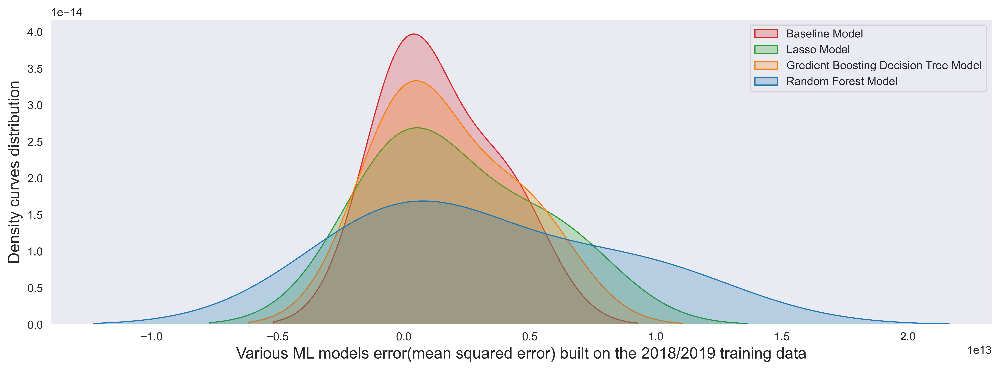

In [92]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)

sns.kdeplot(data=eval_model,shade='fill')
plt.xlabel('Various ML models error(mean squared error) built on the 2018/2019 training data',fontsize=14)
plt.ylabel('Density curves distribution',fontsize=14)
plt.legend(['Baseline Model','Lasso Model','Gredient Boosting Decision Tree Model','Random Forest Model'])
plt.savefig('tables.png')
plt.show();


# Build the validation Dataset

In [93]:
# hold_out_data (2020)
hold_out_data = hold_out_data_df.copy()

In [94]:
# Filter the holdout Dataset
hold_out_data = hold_out_data[['ID','total_annual_sales']]
hold_out_data = hold_out_data.rename(columns={'total_annual_sales':'y'})


In [95]:
# get the 2019 data
data_2019_df = advisors_df[advisors_df['year']==2019]


In [96]:
# Merge the 2019 dataset into the holdout dataset
hold_out_df = data_2019_df.merge(hold_out_data,how='inner',on='ID')
hold_out_df = hold_out_df.drop(['sales_curr','redemption_curr','year','index_x','index_y','aum_P_ALT'],axis=1)
hold_out_df = hold_out_df.set_index('ID')


In [97]:
hold_out_df.shape

(10000, 52)

In [98]:
# Divide the hold_out_data into 3 categories
low_hold_out_data = hold_out_df[hold_out_df['total_annual_sales'] <= 40000]
mid_hold_out_data = hold_out_df[(hold_out_df['total_annual_sales'] > 40000)&(hold_out_df['total_annual_sales'] < 200000)]
high_hold_out_data = hold_out_df[hold_out_df['total_annual_sales'] >= 200000]

print(f'low_bound: {low_hold_out_data.shape[0]} advisors')
print(f'mid_bound: {mid_hold_out_data.shape[0]} advisors')
print(f'high_bound: {high_hold_out_data.shape[0]} advisors')


low_bound: 7487 advisors
mid_bound: 1178 advisors
high_bound: 1335 advisors


In [99]:
below_zero_val = low_hold_out_data[low_hold_out_data['total_annual_sales'] < 0]['total_annual_sales'].dropna()
low_hold_out_data = low_hold_out_data.drop(below_zero_val.index,axis=0)

# outliers_val = high_hold_out_data[high_hold_out_data['total_annual_sales'] > 15000000]['total_annual_sales'].dropna()
# high_hold_out_data = high_hold_out_data.drop(outliers_val.index,axis=0)

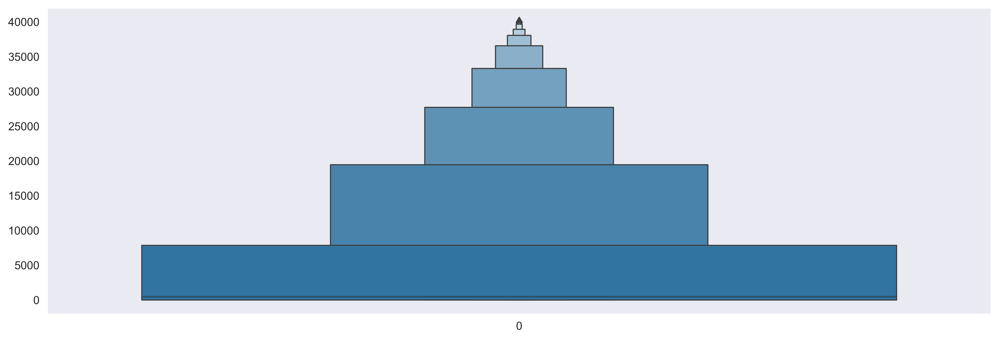

In [100]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.boxenplot(data=low_hold_out_data['total_annual_sales'])

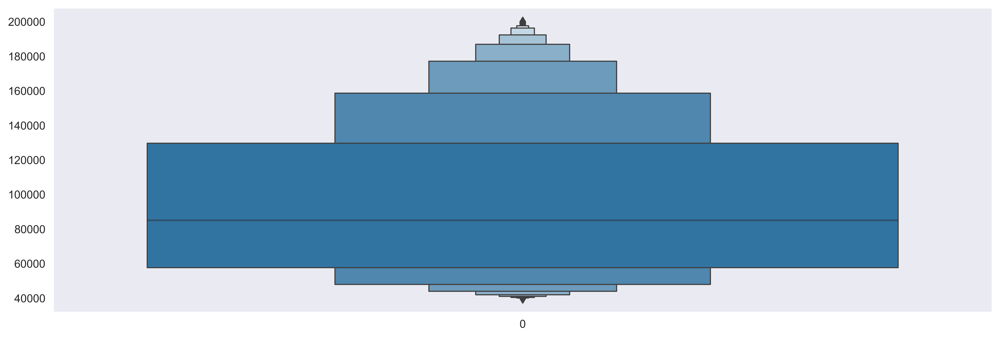

In [101]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.boxenplot(data=mid_hold_out_data['total_annual_sales'])

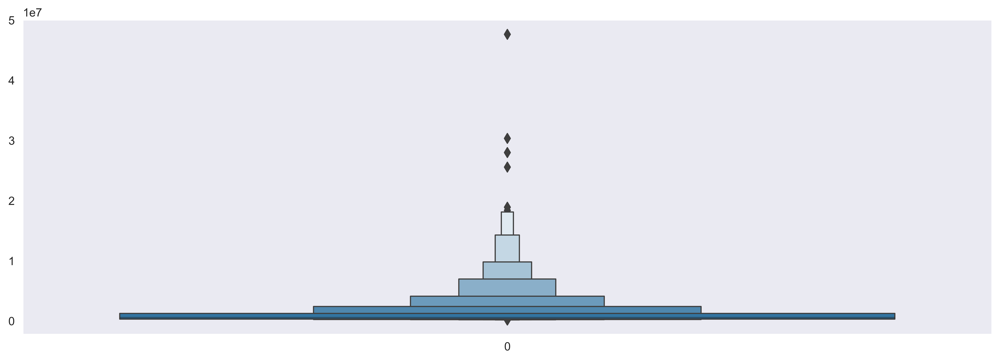

In [102]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
ax = sns.boxenplot(data=high_hold_out_data['total_annual_sales'])

In [103]:
# Standardize the hold_out Dataset

low_hold_out_data_norm = low_hold_out_data.copy()
mid_hold_out_data_norm = mid_hold_out_data.copy()
high_hold_out_data_norm = high_hold_out_data.copy()

from sklearn.preprocessing import StandardScaler

def to_norm_holdout(data):
    scaler = StandardScaler().fit_transform(data.iloc[:,0:32])
    data.iloc[:,0:32] = scaler
    return data

In [104]:
# Transform the Dataset

low_hold_out_data_norm = to_norm_holdout(low_hold_out_data_norm)
mid_hold_out_data_norm = to_norm_holdout(mid_hold_out_data_norm)
high_hold_out_data_norm = to_norm_holdout(high_hold_out_data_norm)


In [105]:
# split the Dataset

low_hold_out_data_norm_X = low_hold_out_data_norm.drop('y',axis=1)
mid_hold_out_data_norm_X = mid_hold_out_data_norm.drop('y',axis=1)
high_hold_out_data_norm_X = high_hold_out_data_norm.drop('y',axis=1)


### Build the evaluation model

In [116]:
holdout_eval_model = pd.DataFrame(data={'loss_2020':['low_mse','mid_mse','high_mse'],
                                'baseline_2020':np.zeros(3),
                                'gbdt_2020':np.zeros(3)})

low_y = low_hold_out_data_norm['y']
mid_y = mid_hold_out_data_norm['y']
high_y = high_hold_out_data_norm['y']

low_yhat = low_hold_out_data_norm['total_annual_sales']
mid_yhat = mid_hold_out_data_norm['total_annual_sales']
high_yhat = high_hold_out_data_norm['total_annual_sales']

mse_hold_base_low = np.mean(np.square(low_y - low_yhat))
mse_hold_base_mid = np.mean(np.square(mid_y - mid_yhat))
mse_hold_base_high = np.mean(np.square(high_y - high_yhat))

holdout_eval_model.loc[0,'baseline_2020'] = mse_hold_base_low
holdout_eval_model.loc[1,'baseline_2020'] = mse_hold_base_mid
holdout_eval_model.loc[2,'baseline_2020'] = mse_hold_base_high

mse_gbdt_low = np.mean(np.square(low_y - low_gbdt.predict(low_hold_out_data_norm_X)))
mse_gbdt_mid = np.mean(np.square(mid_y - mid_gbdt.predict(mid_hold_out_data_norm_X)))
mse_gbdt_high = np.mean(np.square(high_y - high_gbdt.predict(high_hold_out_data_norm_X)))

holdout_eval_model.loc[0,'gbdt_2020'] = mse_gbdt_low
holdout_eval_model.loc[1,'gbdt_2020'] = mse_gbdt_mid
holdout_eval_model.loc[2,'gbdt_2020'] = mse_gbdt_high

mse_rfr_low = np.mean(np.square(low_y - low_rfr.predict(low_hold_out_data_norm_X)))
mse_rfr_mid = np.mean(np.square(mid_y - mid_rfr.predict(mid_hold_out_data_norm_X)))
mse_rfr_high = np.mean(np.square(high_y - high_rfr.predict(high_hold_out_data_norm_X)))

holdout_eval_model.loc[0,'rfr_2020'] = mse_rfr_low
holdout_eval_model.loc[1,'rfr_2020'] = mse_rfr_mid
holdout_eval_model.loc[2,'rfr_2020'] = mse_rfr_high

holdout_eval_model


,loss_2020,baseline_2020,gbdt_2020,rfr_2020
0,low_mse,1.932147e+11,1.918920e+11,1.930409e+11
1,mid_mse,2.143959e+11,1.888690e+11,1.894031e+11
2,high_mse,4.998334e+12,3.507357e+12,2.880319e+12


In [118]:
all_eval_model = eval_model.join(holdout_eval_model)
all_eval_model = all_eval_model.drop(['loss_2020','lasso','gbdt','gbdt_2020'],axis=1)
all_eval_model

,loss,baseline,rfr,baseline_2020,rfr_2020
0,low_mse,1.491800e+11,1.160429e+11,1.932147e+11,1.930409e+11
1,mid_mse,3.085786e+11,2.162171e+11,2.143959e+11,1.894031e+11
2,high_mse,9.183839e+12,3.974383e+12,4.998334e+12,2.880319e+12


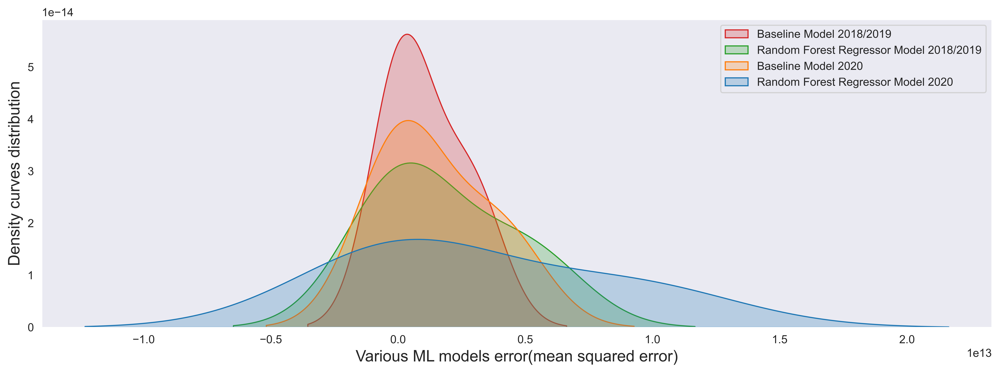

In [119]:
ax,fig = plt.subplots(figsize=(15,5),dpi=600)
sns.kdeplot(data=all_eval_model,shade='fill')
plt.xlabel('Various ML models error(mean squared error)',fontsize=14)
plt.ylabel('Density curves distribution',fontsize=14)
plt.legend(['Baseline Model 2018/2019','Random Forest Regressor Model 2018/2019',
            'Baseline Model 2020','Random Forest Regressor Model 2020'])
plt.savefig('tables_final.png')
plt.show();


# Construct Lift Charts

In [122]:
# Add predicted y_hat to the Dataset

low_hold_out_data_norm['y_hat'] = low_rfr.predict(low_hold_out_data_norm_X)
mid_hold_out_data_norm['y_hat'] = mid_rfr.predict(mid_hold_out_data_norm_X)
high_hold_out_data_norm['y_hat'] = high_rfr.predict(high_hold_out_data_norm_X)


In [123]:
# Function to create the Lift Charts
import math

def create_lift_chart(df):
    # add a decile column based on y_hat
    df['decile'] = pd.qcut(df['y_hat'],10,labels=False)
    
    # add n•_advisors column
    df['n•_advisors'] = 1
    
    # Capture the average
    avg_sales = np.mean(df['y'])
    
    # Group by decile to calculate the number of advisors & sales
    lift_df = df.groupby(['decile']).aggregate({'n•_advisors':np.sum,'y':np.mean})
    lift_df = lift_df.rename(columns={'y':'Sales_per_advisor'})
    lift_df['Sales_per_advisor'] = round(lift_df['Sales_per_advisor'],2)
    
    # Add lift
    lift_df['lift_percentage'] = np.round((lift_df['Sales_per_advisor'] - avg_sales) / avg_sales * 100,2)
    
    # sort the DataFrame and reset the index
    lift_df = lift_df.sort_values(by='Sales_per_advisor',ascending=False)
    lift_df = lift_df.reset_index()
    lift_df = lift_df.drop('decile',axis=1)
    lift_df.index = range(1,11)
    
    # Add cumulative number of advisors
    lift_df['n•_advisors_cumulative'] = 0
    lift_df.loc[1,'n•_advisors_cumulative'] = lift_df.loc[1,'n•_advisors']
    
    for i in range(len(lift_df['n•_advisors'])-1):
        lift_df.loc[i+2,'n•_advisors_cumulative'] = lift_df.loc[i+2,'n•_advisors'] + lift_df.loc[i+1,'n•_advisors_cumulative']
        
    # Add cumulative sales
    lift_df['Sales_per_advisor_cumulative'] = np.zeros(10)
    lift_df.loc[1,'Sales_per_advisor_cumulative'] = lift_df.loc[1,'Sales_per_advisor']
    
    for i in range(len(lift_df['n•_advisors'])-1):
        lift_df.loc[i+2,'Sales_per_advisor_cumulative'] = round(lift_df.loc[i+2,'Sales_per_advisor'].sum()/(i+2),2)
    
    # Add cumulative lift
    lift_df['lift_percentage_cumulative'] = np.zeros(10)
    lift_df.loc[1,'lift_percentage_cumulative'] = lift_df.loc[1,'lift_percentage']
    
    for i in range(len(lift_df['n•_advisors'])-1):
        lift_df.loc[i+2,'lift_percentage_cumulative'] = round(lift_df.loc[1:i+2,'lift_percentage'].sum()/(i+2),2)
    
    lift_df['n•_advisors'] = lift_df['n•_advisors'].apply(lambda x: str(f'{x:,}'))
    lift_df['Sales_per_advisor'] = lift_df['Sales_per_advisor'].apply(lambda x: str(f'{x:,}') + ' $')
    lift_df['lift_percentage'] = lift_df['lift_percentage'].apply(lambda x: str(x) + ' %')
    lift_df['n•_advisors_cumulative'] = lift_df['n•_advisors_cumulative'].apply(lambda x: str(f'{x:,}'))
    lift_df['Sales_per_advisor_cumulative'] = lift_df['Sales_per_advisor_cumulative'].apply(lambda x: str(f'{x:,}') + ' $')
    lift_df['lift_percentage_cumulative'] = lift_df['lift_percentage_cumulative'].apply(lambda x: str(x) + ' %')
        
    return lift_df
    

## Create the Lift Chart tables

In [124]:
low_lift_df  = create_lift_chart(low_hold_out_data_norm)
mid_lift_df  = create_lift_chart(mid_hold_out_data_norm)
high_lift_df = create_lift_chart(high_hold_out_data_norm)

In [125]:
#!pip install dataframe-image
import dataframe_image as dfi


In [126]:
dfi.export(low_lift_df, 'low_lift_df_table.png')
low_lift_df


,n•_advisors,Sales_per_advisor,lift_percentage,n•_advisors_cumulative,Sales_per_advisor_cumulative,lift_percentage_cumulative
1,430,"70,711.78 $",73.77 %,430,"70,711.78 $",73.77 %
2,430,"67,329.83 $",65.46 %,860,"33,664.92 $",69.61 %
3,430,"61,318.19 $",50.69 %,"1,290","20,439.4 $",63.31 %
4,430,"54,251.15 $",33.32 %,"1,720","13,562.79 $",55.81 %
5,430,"38,890.83 $",-4.43 %,"2,150","7,778.17 $",43.76 %
6,429,"36,355.26 $",-10.66 %,"2,579","6,059.21 $",34.69 %
7,430,"31,011.89 $",-23.79 %,"3,009","4,430.27 $",26.34 %
8,430,"24,614.25 $",-39.51 %,"3,439","3,076.78 $",18.11 %
9,430,"11,794.42 $",-71.02 %,"3,869","1,310.49 $",8.2 %
10,430,"10,632.3 $",-73.87 %,"4,299","1,063.23 $",-0.0 %


In [127]:
dfi.export(mid_lift_df, 'mid_lift_df_table.png')
mid_lift_df


,n•_advisors,Sales_per_advisor,lift_percentage,n•_advisors_cumulative,Sales_per_advisor_cumulative,lift_percentage_cumulative
1,118,"259,334.28 $",61.38 %,118,"259,334.28 $",61.38 %
2,117,"191,042.3 $",18.88 %,235,"95,521.15 $",40.13 %
3,118,"187,434.39 $",16.64 %,353,"62,478.13 $",32.3 %
4,117,"182,755.41 $",13.73 %,470,"45,688.85 $",27.66 %
5,118,"172,742.42 $",7.49 %,588,"34,548.48 $",23.62 %
6,118,"161,248.51 $",0.34 %,706,"26,874.75 $",19.74 %
7,118,"130,776.77 $",-18.62 %,824,"18,682.4 $",14.26 %
8,118,"125,319.55 $",-22.02 %,942,"15,664.94 $",9.73 %
9,118,"123,336.34 $",-23.25 %,"1,060","13,704.04 $",6.06 %
10,118,"73,444.59 $",-54.3 %,"1,178","7,344.46 $",0.03 %


In [128]:
dfi.export(high_lift_df, 'high_lift_df_table.png')
high_lift_df


,n•_advisors,Sales_per_advisor,lift_percentage,n•_advisors_cumulative,Sales_per_advisor_cumulative,lift_percentage_cumulative
1,134,"3,972,946.1 $",307.21 %,134,"3,972,946.1 $",307.21 %
2,133,"1,593,211.9 $",63.3 %,267,"796,605.95 $",185.26 %
3,134,"1,118,968.15 $",14.69 %,401,"372,989.38 $",128.4 %
4,133,"692,752.56 $",-28.99 %,534,"173,188.14 $",89.05 %
5,133,"564,251.82 $",-42.17 %,667,"112,850.36 $",62.81 %
6,134,"469,013.23 $",-51.93 %,801,"78,168.87 $",43.68 %
7,133,"392,011.96 $",-59.82 %,934,"56,001.71 $",28.9 %
8,133,"375,199.61 $",-61.54 %,"1,067","46,899.95 $",17.59 %
9,134,"366,283.43 $",-62.46 %,"1,201","40,698.16 $",8.7 %
10,134,"202,338.53 $",-79.26 %,"1,335","20,233.85 $",-0.1 %
